# Code for IRP

This notebook will be a commented code for the IRP, it will not be ready for the IRP notebook but will be, hopefully, a quite complete code section so i can put most of that in and also use the comments and results for the write up 

# Loading in the data and making any changes - checkng values etc. 

## Crashes in Cambridge 

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd

import folium
from folium import plugins
from folium.plugins import MeasureControl
from branca.colormap import linear
from branca import colormap
from branca import colormap as cm

import warnings
warnings.simplefilter('ignore', DeprecationWarning)
warnings.filterwarnings('ignore')

import networkx as nx

import matplotlib.pyplot as plt

import osmnx as ox
from IPython.display import Image

import seaborn as sns

In [2]:
ox.__version__

'1.9.1'

I have two csv's of locations of crashes that took place in Cambridgeshire in the years 2017/2018 - so now loading them in and going to merge them together so I have more datapoints. First I am going to inspect just the 2018 dataset to see what variables may be worth keeping in the dataset and then I will do the same for the 2017 dataset and merge the two.  

In [3]:
crashes = pd.read_csv("data/Final/RTC Location 2018.csv")
crashes.head()

,Date,Police_ref,Easting,Northing,Severity,Road_cond,Visibility,Casualties,Pedestrian,Cycles,...,Cross_ctrl,Cross_fac,Weather,SpCond,Carr_haz,Day,Location,Local_Auth,ReportedAt,Parish
0,20180101,18263388,519784,299454,2. Serious,2. Wet/Damp,4. Darkness: street lights present and lit,1,0,0,...,0. None,1. Zebra crossing,1. Fine without high winds,0,0. None,2. Monday,EASTFIELD ROAD AT JN WITH PADHOLME ROAD,E06000031,1. Yes,181
1,20180102,18257386,519682,270658,3. Slight,2. Wet/Damp,6. Darkness: no street lighting,2,0,0,...,0. None,0. None within 50m,1. Fine without high winds,0,0. None,3. Tuesday,NEAR BRAMPTON HUT SERVICES SOUTBOUND A1 NEAR J...,E07000011,1. Yes,26
2,20180103,18259484,540715,242553,3. Slight,1. Dry,6. Darkness: no street lighting,1,0,0,...,0. None,0. None within 50m,4. Fine with high winds,0,0. None,4. Wednesday,BARLEY ROAD B1368,E07000012,1. Yes,95
3,20180103,18257077,546231,257858,3. Slight,1. Dry,4. Darkness: street lights present and lit,1,0,0,...,0. None,5. Ped. phase at traffic signal junction,1. Fine without high winds,0,0. None,4. Wednesday,MILL ROAD AT JN WITH GWYDIR STREET,E07000008,1. Yes,0
4,20180103,18255977,530858,288082,3. Slight,2. Wet/Damp,6. Darkness: no street lighting,1,0,0,...,0. None,0. None within 50m,4. Fine with high winds,0,0. None,4. Wednesday,FORTY FOOT BANK B1096,E07000011,2. No - accident was reported 'over the counter',184


In [4]:
crashes.shape

(1802, 34)

In [5]:
crashes.columns

Index(['Date', 'Police_ref', 'Easting', 'Northing', 'Severity', 'Road_cond',
       'Visibility', 'Casualties', 'Pedestrian', 'Cycles', 'P2W', 'OAPs',
       'Children', 'Manoeuvre', 'Time', 'Vehicles', 'Roadclass1', 'Roadnum1',
       'Road_Type', 'Speed_Lim', 'Junct_det', 'Junct_ctrl', 'Roadclass2',
       'Roadnum2', 'Cross_ctrl', 'Cross_fac', 'Weather', 'SpCond', 'Carr_haz',
       'Day', 'Location', 'Local_Auth', 'ReportedAt', 'Parish'],
      dtype='object')

I am now going to inspect some of the columns a bit more to see what variables may be important to keep in my analysis, to do this I am going to inspect individual columns and also use the .describe function to inspect both numeric and non-numeric variables 

In [6]:
descriptive_stats = crashes.describe()
descriptive_stats

,Date,Police_ref,Easting,Northing,Casualties,Pedestrian,Cycles,P2W,OAPs,Children,Vehicles,Roadnum1,Speed_Lim,Roadnum2,SpCond,Parish
count,1.802000e+03,1.802000e+03,1802.000000,1802.000000,1802.000000,1802.000000,1802.000000,1802.000000,1802.000000,1802.000000,1802.000000,1802.00000,1802.000000,1802.000000,1802.000000,1802.000000
mean,2.018068e+07,1.839395e+07,534291.418979,277965.870699,1.420089,0.108213,0.213651,0.093230,0.183130,0.126526,1.896226,340.86626,43.351831,104.094340,0.138735,30.972808
std,3.412436e+02,1.934851e+05,14396.808824,19993.111708,0.975261,0.323002,0.411349,0.292738,0.461492,0.439039,0.735245,507.33307,16.345026,351.190348,0.793266,67.088146
min,2.018010e+07,1.825475e+07,502158.000000,241060.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.00000,20.000000,0.000000,0.000000,0.000000
25%,2.018041e+07,1.828846e+07,519548.500000,259402.750000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.00000,30.000000,0.000000,0.000000,0.000000
50%,2.018071e+07,1.831516e+07,537963.000000,273379.500000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,10.00000,30.000000,0.000000,0.000000,0.000000
75%,2.018101e+07,1.834028e+07,546049.250000,298868.250000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,660.75000,60.000000,0.000000,0.000000,0.000000
max,2.018123e+07,1.891454e+07,570216.000000,316572.000000,20.000000,2.000000,2.000000,2.000000,4.000000,7.000000,10.000000,2070.00000,70.000000,6118.000000,7.000000,271.000000


In [7]:
descriptive_stats_non_numerical = crashes.describe(exclude='number')
descriptive_stats_non_numerical

,Severity,Road_cond,Visibility,Manoeuvre,Time,Roadclass1,Road_Type,Junct_det,Junct_ctrl,Roadclass2,Cross_ctrl,Cross_fac,Weather,Carr_haz,Day,Location,Local_Auth,ReportedAt
count,1802,1802,1802,1802,1802,1802,1802,1802,1802,1801,1802,1802,1802,1802,1802,1802,1802,1802
unique,3,4,5,4,716,6,6,9,5,7,3,6,9,6,7,1722,6,2
top,3. Slight,1. Dry,1. Daylight,0. No turn,17:30,6. Unclassified,6. Single carriageway,0. Not within 20m of junction,. Not applicable,. Not applicable,0. None,0. None within 50m,1. Fine without high winds,0. None,6. Friday,A14,E06000031,1. Yes
freq,1410,1334,1317,1336,23,813,1254,916,915,915,1790,1532,1479,1765,300,7,458,1360


In [8]:
crashes['Junct_det'].value_counts()

Junct_det
0. Not within 20m of junction                        916
3. T & Stag Jct                                      490
1. Roundabout                                        195
6. Crossroads                                         66
5. Slip Road                                          47
8. Pri Drive                                          45
9. Other                                              28
2. Mini roundabout                                    13
7. Junction - more than 4 arms (not a roundabout)      2
Name: count, dtype: int64

I believe that alongside the counts of casualties, number of bikes or pedestrians invovled, the important variables to include in my analysis are the road_type, speed_limit, where the crash took place (junct_det), the weather, and the day of the week that the crash took place. 

In [9]:
subset_crashes = crashes[['Date', 'Police_ref', 'Easting', 'Northing', 'Severity', 'Casualties', 'Pedestrian', 'Cycles',
                          'Road_Type', 'Speed_Lim', 'Junct_det', 'Weather', 'Day', 'Local_Auth'
                         ]]

subset_crashes.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth
0,20180101,18263388,519784,299454,2. Serious,1,0,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,2. Monday,E06000031
1,20180102,18257386,519682,270658,3. Slight,2,0,0,3. Dual carriageway,40,0. Not within 20m of junction,1. Fine without high winds,3. Tuesday,E07000011
2,20180103,18259484,540715,242553,3. Slight,1,0,0,6. Single carriageway,30,0. Not within 20m of junction,4. Fine with high winds,4. Wednesday,E07000012
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008
4,20180103,18255977,530858,288082,3. Slight,1,0,0,6. Single carriageway,50,0. Not within 20m of junction,4. Fine with high winds,4. Wednesday,E07000011


I am now going to repeat this process for the 2017 crashes dataset and then bind the two together. 

In [10]:
crashes_2017 = pd.read_csv("data/Final/RTC Location 2017.csv")
crashes_2017.head()

,Date,Police_ref,Easting,Northing,Veh_ref,Cas_ref,Severity,Road_cond,Visibility,Casualties,...,Cross_ctrl,Cross_fac,Weather,SpCond,Carr_haz,Day,Location,Local_Auth,ReportedAt,Parish
0,20170101,17146457,545741,310887,NaN,NaN,3. Slight,2. Wet/Damp,4. Darkness: street lights present and lit,1,...,0. None,0. None within 50m,1. Fine without high winds,0. None,0. None,1. Sunday,CRAB MARSH,E07000010,1. Yes,253
1,20170102,17146536,529059,286852,NaN,NaN,3. Slight,4. Frost/Ice,1. Daylight,1,...,0. None,0. None within 50m,1. Fine without high winds,0. None,0. None,2. Monday,STOCKING FEN ROAD 460 METRES WEST OF JUNCTION ...,E07000011,1. Yes,184
2,20170102,17146662,540027,314219,NaN,NaN,2. Serious,4. Frost/Ice,1. Daylight,1,...,0. None,0. None within 50m,1. Fine without high winds,0. None,0. None,2. Monday,OUTSIDE PECKS FARM CROSS DROVE,E07000010,1. Yes,227
3,20170102,17146686,546900,290440,NaN,NaN,3. Slight,4. Frost/Ice,1. Daylight,1,...,0. None,0. None within 50m,1. Fine without high winds,0. None,0. None,2. Monday,OUTSIDE PLANTATION FARM WIMBLINGTON ROAD B1093,E07000010,1. Yes,250
4,20170102,17146697,529780,270124,NaN,NaN,3. Slight,4. Frost/Ice,4. Darkness: street lights present and lit,1,...,0. None,0. None within 50m,1. Fine without high winds,0. None,0. None,2. Monday,38 MARSH LANE UNSPECIFIED ROAD OR LOCATION,E07000011,1. Yes,115


In [11]:
crashes_2017_sub = crashes_2017[['Date', 'Police_ref', 'Easting', 'Northing', 'Severity', 'Casualties', 'Pedestrian', 'Cycles',
                          'Road_Type', 'Speed_Lim', 'Junct_det', 'Weather', 'Day', 'Local_Auth'
                         ]]

crashes_2017_sub.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth
0,20170101,17146457,545741,310887,3. Slight,1,0,0,6. Single carriageway,30,0. Not within 20m of junction,1. Fine without high winds,1. Sunday,E07000010
1,20170102,17146536,529059,286852,3. Slight,1,0,0,6. Single carriageway,60,0. Not within 20m of junction,1. Fine without high winds,2. Monday,E07000011
2,20170102,17146662,540027,314219,2. Serious,1,0,0,6. Single carriageway,60,0. Not within 20m of junction,1. Fine without high winds,2. Monday,E07000010
3,20170102,17146686,546900,290440,3. Slight,1,0,0,6. Single carriageway,60,0. Not within 20m of junction,1. Fine without high winds,2. Monday,E07000010
4,20170102,17146697,529780,270124,3. Slight,1,0,0,6. Single carriageway,30,0. Not within 20m of junction,1. Fine without high winds,2. Monday,E07000011


In [12]:
merged_df = pd.concat([subset_crashes, crashes_2017_sub])
merged_df.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth
0,20180101,18263388,519784,299454,2. Serious,1,0,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,2. Monday,E06000031
1,20180102,18257386,519682,270658,3. Slight,2,0,0,3. Dual carriageway,40,0. Not within 20m of junction,1. Fine without high winds,3. Tuesday,E07000011
2,20180103,18259484,540715,242553,3. Slight,1,0,0,6. Single carriageway,30,0. Not within 20m of junction,4. Fine with high winds,4. Wednesday,E07000012
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008
4,20180103,18255977,530858,288082,3. Slight,1,0,0,6. Single carriageway,50,0. Not within 20m of junction,4. Fine with high winds,4. Wednesday,E07000011


In [13]:
merged_df.shape

(3229, 14)

In [14]:
#check for NAs 
nan_easting = merged_df['Easting'].isna().sum()
nan_northing = merged_df['Northing'].isna().sum()
print(nan_easting,nan_northing)

0 0


I have coordinated for the location of each crash in eating and northing, therefore, I am going to make geometries with EPSG:27700, which the the projected coordinates for the UK 

In [15]:
geometry = gpd.points_from_xy(merged_df['Easting'], merged_df['Northing'])
gdf = gpd.GeoDataFrame(merged_df, crs="EPSG:27700", geometry=geometry)
gdf.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry
0,20180101,18263388,519784,299454,2. Serious,1,0,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,2. Monday,E06000031,POINT (519784.000 299454.000)
1,20180102,18257386,519682,270658,3. Slight,2,0,0,3. Dual carriageway,40,0. Not within 20m of junction,1. Fine without high winds,3. Tuesday,E07000011,POINT (519682.000 270658.000)
2,20180103,18259484,540715,242553,3. Slight,1,0,0,6. Single carriageway,30,0. Not within 20m of junction,4. Fine with high winds,4. Wednesday,E07000012,POINT (540715.000 242553.000)
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008,POINT (546231.000 257858.000)
4,20180103,18255977,530858,288082,3. Slight,1,0,0,6. Single carriageway,50,0. Not within 20m of junction,4. Fine with high winds,4. Wednesday,E07000011,POINT (530858.000 288082.000)


In [16]:
gdf.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [17]:
gdf.explore()

There are locations from the whole of Cambridgeshire, whereas I only want the locations of accidents in the city of Cambridge, therefore I am going to clip it by the extent of Cambridge. I could download the whole local authority shapefile and clip it, but I already have a clipped shapefile of City of Cambridge and South Cambridgeshire so I am going to use that. 

In [18]:
border = gpd.read_file('data/Final/cambs_and_southCambs.shp')

In [19]:
border.head()

,label,ltla22cd,ltla22nm,ltla22nmw,name,geometry
0,E92000001E12000006E07000012,E07000012,South Cambridgeshire,NaN,South Cambridgeshire,"POLYGON ((533492.563 240440.531, 533486.321 24..."
1,E92000001E12000006E07000008,E07000008,Cambridge,NaN,Cambridge,"POLYGON ((545106.163 253956.936, 545100.123 25..."


In [20]:
city = border[border['ltla22nm'] == 'Cambridge']
city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1 entries, 1 to 1
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   label      1 non-null      object  
 1   ltla22cd   1 non-null      object  
 2   ltla22nm   1 non-null      object  
 3   ltla22nmw  0 non-null      float64 
 4   name       1 non-null      object  
 5   geometry   1 non-null      geometry
dtypes: float64(1), geometry(1), object(4)
memory usage: 56.0+ bytes


In [21]:
city = city.drop(columns=['ltla22nmw'])
city.head()

,label,ltla22cd,ltla22nm,name,geometry
1,E92000001E12000006E07000008,E07000008,Cambridge,Cambridge,"POLYGON ((545106.163 253956.936, 545100.123 25..."


Next, I am going to select the crashes that are within the border of Cambridge City, city.unary_union is used because it makes a single geometry and this means that the .intersects code works.

<Axes: >

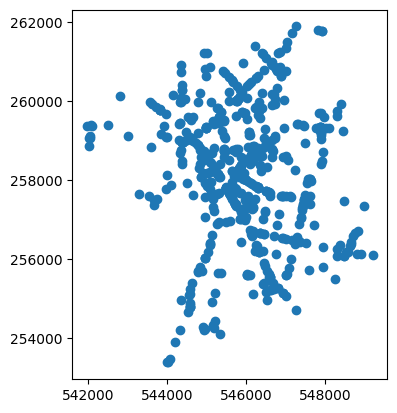

In [22]:
city_single = city.unary_union 
city_crash = gdf[gdf.intersects(city_single)] # Select the crashes that are wothing this border
city_crash.plot()

In [23]:
city_crash.shape

(620, 15)

Having clipped the crashes to just the City of Cambridge, there are 620 crashes that took place over the course of the 2 years. 

In [24]:
city_crash.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008,POINT (546231.000 257858.000)
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (546238.000 257859.000)
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (545200.000 258267.000)
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,6. Friday,E07000008,POINT (544638.000 259600.000)
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (546395.000 261212.000)


In [25]:
city_crash.dtypes

Date             int64
Police_ref       int64
Easting          int64
Northing         int64
Severity        object
Casualties       int64
Pedestrian       int64
Cycles           int64
Road_Type       object
Speed_Lim        int64
Junct_det       object
Weather         object
Day             object
Local_Auth      object
geometry      geometry
dtype: object


## Cambridge Drive Network

Now, I am going to load in the street network of Cambridge, I am then going to also load in the cycle and street networks. This is useful because I can then select the bike network. 

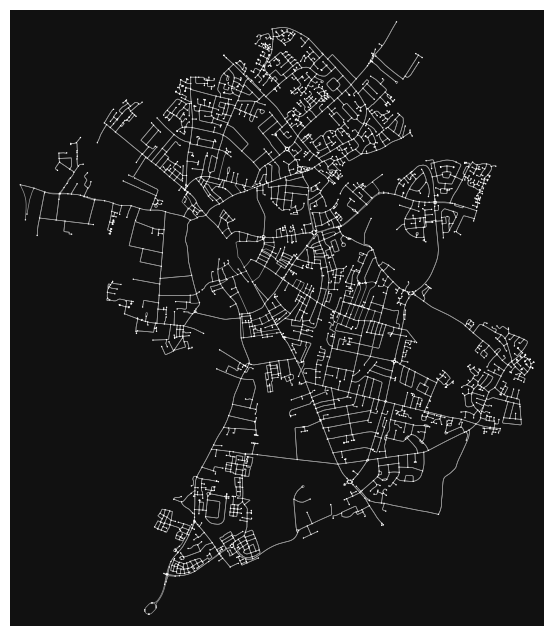

In [27]:
C_drive = ox.graph_from_place("Cambridge, UK", network_type="drive")

fig, ax = ox.plot_graph(C_drive, node_size=1, edge_linewidth=0.5)

In [28]:
C_drive.number_of_nodes()

3279

There are thousands of nodes over quite a small area, therefore I want to reduce the number of nodes in the graph so that when i determine how many crashes there are per node, there will not be hundreds of nodes overlapping with each other. Therefore, I am going to use code adapted from Geoff Boeing [Clean Up Node Code](https://github.com/gboeing/osmnx-examples/blob/main/notebooks/04-simplify-graph-consolidate-nodes.ipynb) to clean up the nodes that are in interesections within a 25 metre buffer of each other, it will also remove the dead ends. 

In [29]:
# get a GeoSeries of consolidated intersections
G_proj = ox.project_graph(C_drive)
ints = ox.consolidate_intersections(C_drive, rebuild_graph=False, tolerance=25, dead_ends=False)
len(ints)

1

In [30]:
G2 = ox.consolidate_intersections(G_proj, rebuild_graph=True, tolerance=15, dead_ends=False)
len(G2)

1665

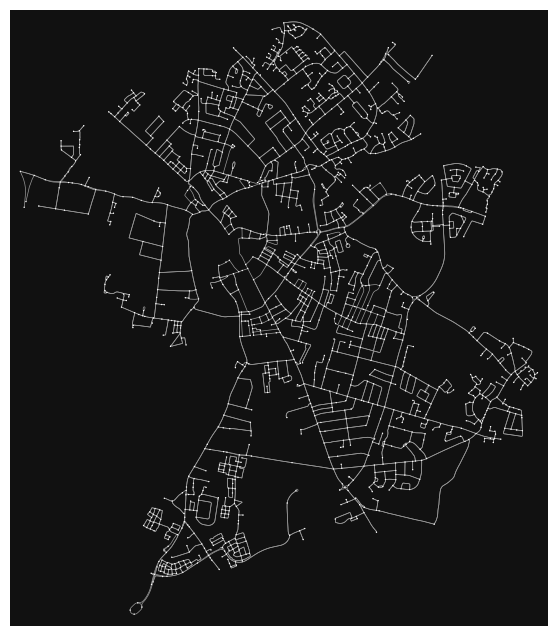

In [31]:
fig, ax = ox.plot_graph(G2, node_size=1, edge_linewidth=0.5)

This has halved the number of nodes in the graph, whilst retaining the overall bounds and shape which is great. 

I am now going to select jsut the nodes from the graph and make it a geodataframe so that I can continue my analysis.

In [32]:
nodes = ox.graph_to_gdfs(G2, edges=False)
nodes.explore(tiles="cartodbpositron", marker_kwds={"radius": 1}, color='purple')

## Cambridge Bike Network 

Next step is to load in the bike edges and then see if I am able to select the edges that are just bike lanes

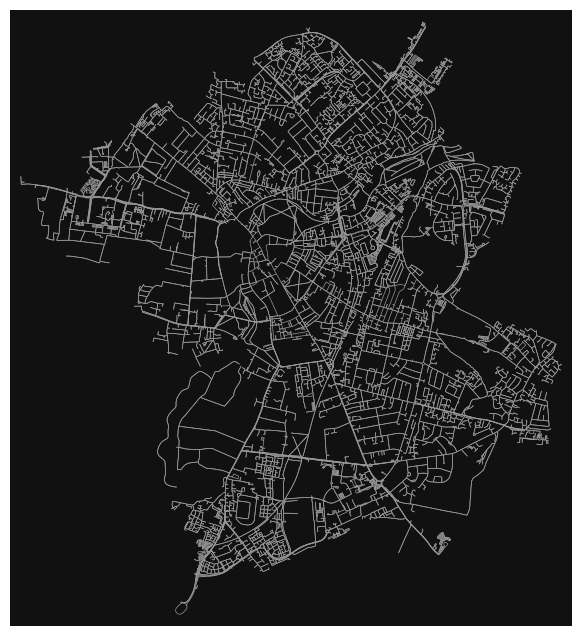

In [33]:
C_bike = ox.graph_from_place("Cambridge, UK", network_type="bike")

fig, ax = ox.plot_graph(C_bike, node_size=0, edge_linewidth=0.5)

In [34]:
list(C_bike.edges(data=True))

[(104521,
  20823642,
  {'osmid': 147495430,
   'oneway': True,
   'name': "Saint Andrew's Street",
   'highway': 'residential',
   'maxspeed': '20 mph',
   'reversed': False,
   'length': 129.923,
   'geometry': <LINESTRING (0.123 52.204, 0.124 52.204, 0.124 52.203, 0.124 52.203)>}),
 (104522,
  8773513179,
  {'osmid': 147493289,
   'oneway': True,
   'name': "Saint Andrew's Street",
   'highway': 'residential',
   'maxspeed': '20 mph',
   'access': 'destination',
   'reversed': False,
   'length': 21.058}),
 (104522,
  104521,
  {'osmid': 43407810,
   'oneway': True,
   'name': "Saint Andrew's Street",
   'highway': 'residential',
   'maxspeed': '20 mph',
   'reversed': False,
   'length': 62.376,
   'geometry': <LINESTRING (0.123 52.204, 0.123 52.204, 0.123 52.204, 0.123 52.204)>}),
 (104523,
  1160006597,
  {'osmid': [80997314, 1234016410, 3384861, 5137551],
   'oneway': True,
   'name': ['Hobson Street', 'King Street'],
   'highway': 'residential',
   'maxspeed': '20 mph',
   'acc

The above code clearly shows that the cycle network of Cambridge is quite extensive, and that I am able to select the cycle lanes only by selecting highway == cycleway 

The following code will make a gdf of just the edges of the OSMnx network where I can then subset the dataframe to just select the bike lanes. 

In [35]:
edges = ox.graph_to_gdfs(C_bike, nodes=False)

In [36]:
edges.head()

osmid  oneway  \
u      v          key                                                     
104521 20823642   0                                   147495430    True   
104522 8773513179 0                                   147493289    True   
       104521     0                                    43407810    True   
104523 1160006597 0    [80997314, 1234016410, 3384861, 5137551]    True   
       104524     0                                   760780336   False   

                                               name      highway maxspeed  \
u      v          key                                                       
104521 20823642   0           Saint Andrew's Street  residential   20 mph   
104522 8773513179 0           Saint Andrew's Street  residential   20 mph   
       104521     0           Saint Andrew's Street  residential   20 mph   
104523 1160006597 0    [Hobson Street, King Street]  residential   20 mph   
       104524     0                   Sidney Street   pedestrian   20 mph   

                      reversed   length  \
u      v          key                     
104521 20823642   0      False  129.923   
104522 8773513179 0      False   21.058   
       104521     0      False   62.376   
104523 1160006597 0      False  260.645   
       104524     0      False   31.392   

                                                                geometry  \
u      v          key                                                      
104521 20823642   0    LINESTRING (0.12349 52.20355, 0.12351 52.20353...   
104522 8773513179 0      LINESTRING (0.12304 52.20404, 0.12290 52.20421)   
       104521     0    LINESTRING (0.12304 52.20404, 0.12326 52.20380...   
104523 1160006597 0    LINESTRING (0.12180 52.20529, 0.12174 52.20535...   
       104524     0    LINESTRING (0.12180 52.20529, 0.12163 52.20532...   

                            access width lanes  ref est_width bridge junction  \
u      v          key                                                           
104521 20823642   0            NaN   NaN   NaN  NaN       NaN    NaN      NaN   
104522 8773513179 0    destination   NaN   NaN  NaN       NaN    NaN      NaN   
       104521     0            NaN   NaN   NaN  NaN       NaN    NaN      NaN   
104523 1160006597 0    destination   NaN   NaN  NaN       NaN    NaN      NaN   
       104524     0            NaN   NaN   NaN  NaN       NaN    NaN      NaN   

                      tunnel service area  
u      v          key                      
104521 20823642   0      NaN     NaN  NaN  
104522 8773513179 0      NaN     NaN  NaN  
       104521     0      NaN     NaN  NaN  
104523 1160006597 0      NaN     NaN  NaN  
       104524     0      NaN     NaN  NaN

In [37]:
cycle_path = edges[edges['highway'] == 'cycleway']
cycle_path.head()

,,,osmid,oneway,name,highway,maxspeed,reversed,length,geometry,access,width,lanes,ref,est_width,bridge,junction,tunnel,service,area
u,v,key,,,,,,,,,,,,,,,,,,
104558,1481148448,0,134758864,False,NaN,cycleway,NaN,True,9.259,"LINESTRING (0.11041 52.21054, 0.11033 52.21048)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104567,944245369,0,42691276,False,Burrell's Walk,cycleway,NaN,True,5.333,"LINESTRING (0.11128 52.20575, 0.11120 52.20575)",NaN,NaN,NaN,NaN,2.5,NaN,NaN,NaN,NaN,NaN
104576,1014889406,0,3997857,False,NaN,cycleway,NaN,False,4.135,"LINESTRING (0.10591 52.20588, 0.10597 52.20587)",NaN,NaN,NaN,NaN,2.5,NaN,NaN,NaN,NaN,NaN
104578,104587,0,"[3997912, 1210617018]",False,Coton Path,cycleway,NaN,False,374.376,"LINESTRING (0.09897 52.20681, 0.09891 52.20682...",NaN,NaN,NaN,NaN,2.5,NaN,NaN,NaN,NaN,NaN
104587,20962991,0,"[164021976, 3997915, 164021974]",False,Clerk Maxwell Road,cycleway,NaN,False,13.697,"LINESTRING (0.09412 52.20799, 0.09412 52.20800...",NaN,NaN,NaN,NaN,2.5,yes,NaN,NaN,NaN,NaN


Now I have my data selected and cleaned, I can now determine whether there are issues with connectivity in Cambridge and determine any reasons for more crashes in an area and therefore opportunities to reduce the number of crashes in the area.

## Deprivation and Access to Car data 

In [105]:
LSOA_gdf = gpd.read_file("data/Final/england_lsoa_2011.shp")
LSOA_gdf.head()

,code,name,label,geometry
0,E01000037,Barking and Dagenham 003B,E09000002E02000004E01000037,"POLYGON ((551549.998 187364.637, 551528.633 18..."
1,E01000038,Barking and Dagenham 003C,E09000002E02000004E01000038,"POLYGON ((550920.362 187341.138, 550921.876 18..."
2,E01000039,Barking and Dagenham 003D,E09000002E02000004E01000039,"POLYGON ((551431.061 186927.155, 551444.481 18..."
3,E01000040,Barking and Dagenham 019A,E09000002E02000020E01000040,"POLYGON ((545806.481 184158.048, 545806.760 18..."
4,E01000041,Barking and Dagenham 017A,E09000002E02000018E01000041,"POLYGON ((547256.387 184393.166, 547256.625 18..."


In [106]:
LSOA_clipped = gpd.clip(LSOA_gdf, city.geometry)

LSOA_clipped.head()

,code,name,label,geometry
17693,E01018224,South Cambridgeshire 009A,E07000012E02003783E01018224,GEOMETRYCOLLECTION (POLYGON ((542102.813 25975...
17761,E01018295,South Cambridgeshire 012D,E07000012E02003786E01018295,"MULTIPOLYGON (((548872.438 254755.500, 548892...."
17758,E01018292,South Cambridgeshire 012A,E07000012E02003786E01018292,GEOMETRYCOLLECTION (POLYGON ((548058.375 25487...
17472,E01017995,Cambridge 013D,E07000008E02003731E01017995,"POLYGON ((548145.124 255848.938, 548145.148 25..."
17470,E01017993,Cambridge 013B,E07000008E02003731E01017993,"POLYGON ((546064.326 256187.986, 546067.650 25..."


In [108]:
IMD_data = pd.read_csv("data/Final/IMD_data.csv")
IMD_data.head()

,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Rank,Index of Multiple Deprivation (IMD) Decile
0,E01000001,City of London 001A,E09000001,City of London,"29,199",9
1,E01000002,City of London 001B,E09000001,City of London,"30,379",10
2,E01000003,City of London 001C,E09000001,City of London,"14,915",5
3,E01000005,City of London 001E,E09000001,City of London,"8,678",3
4,E01000006,Barking and Dagenham 016A,E09000002,Barking and Dagenham,"14,486",5


In [109]:
cambs_IMD = pd.merge(LSOA_clipped, IMD_data,  left_on="code", right_on="LSOA code (2011)")
cambs_IMD.head()

,code,name,label,geometry,LSOA code (2011),LSOA name (2011),Local Authority District code (2019),Local Authority District name (2019),Index of Multiple Deprivation (IMD) Rank,Index of Multiple Deprivation (IMD) Decile
0,E01018224,South Cambridgeshire 009A,E07000012E02003783E01018224,GEOMETRYCOLLECTION (POLYGON ((542102.813 25975...,E01018224,South Cambridgeshire 009A,E07000012,South Cambridgeshire,"24,319",8
1,E01018295,South Cambridgeshire 012D,E07000012E02003786E01018295,"MULTIPOLYGON (((548872.438 254755.500, 548892....",E01018295,South Cambridgeshire 012D,E07000012,South Cambridgeshire,"32,091",10
2,E01018292,South Cambridgeshire 012A,E07000012E02003786E01018292,GEOMETRYCOLLECTION (POLYGON ((548058.375 25487...,E01018292,South Cambridgeshire 012A,E07000012,South Cambridgeshire,"31,089",10
3,E01017995,Cambridge 013D,E07000008E02003731E01017995,"POLYGON ((548145.124 255848.938, 548145.148 25...",E01017995,Cambridge 013D,E07000008,Cambridge,"32,545",10
4,E01017993,Cambridge 013B,E07000008E02003731E01017993,"POLYGON ((546064.326 256187.986, 546067.650 25...",E01017993,Cambridge 013B,E07000008,Cambridge,"28,401",9


In [110]:
#removing some columns 
cambs_IMD = cambs_IMD.drop(columns=['label', 'LSOA code (2011)', 'LSOA name (2011)', 'Local Authority District code (2019)',
                                   'Index of Multiple Deprivation (IMD) Rank'])
cambs_IMD.head()

,code,name,geometry,Local Authority District name (2019),Index of Multiple Deprivation (IMD) Decile
0,E01018224,South Cambridgeshire 009A,GEOMETRYCOLLECTION (POLYGON ((542102.813 25975...,South Cambridgeshire,8
1,E01018295,South Cambridgeshire 012D,"MULTIPOLYGON (((548872.438 254755.500, 548892....",South Cambridgeshire,10
2,E01018292,South Cambridgeshire 012A,GEOMETRYCOLLECTION (POLYGON ((548058.375 25487...,South Cambridgeshire,10
3,E01017995,Cambridge 013D,"POLYGON ((548145.124 255848.938, 548145.148 25...",Cambridge,10
4,E01017993,Cambridge 013B,"POLYGON ((546064.326 256187.986, 546067.650 25...",Cambridge,9


In [111]:
cambs_IMD = cambs_IMD.rename(columns={'Index of Multiple Deprivation (IMD) Decile': 'IMD_rank'})
cambs_IMD.head()

,code,name,geometry,Local Authority District name (2019),IMD_rank
0,E01018224,South Cambridgeshire 009A,GEOMETRYCOLLECTION (POLYGON ((542102.813 25975...,South Cambridgeshire,8
1,E01018295,South Cambridgeshire 012D,"MULTIPOLYGON (((548872.438 254755.500, 548892....",South Cambridgeshire,10
2,E01018292,South Cambridgeshire 012A,GEOMETRYCOLLECTION (POLYGON ((548058.375 25487...,South Cambridgeshire,10
3,E01017995,Cambridge 013D,"POLYGON ((548145.124 255848.938, 548145.148 25...",Cambridge,10
4,E01017993,Cambridge 013B,"POLYGON ((546064.326 256187.986, 546067.650 25...",Cambridge,9


In [112]:
cambs_IMD = cambs_IMD.drop(cambs_IMD.index[:3])
cambs_IMD.head()

,code,name,geometry,Local Authority District name (2019),IMD_rank
3,E01017995,Cambridge 013D,"POLYGON ((548145.124 255848.938, 548145.148 25...",Cambridge,10
4,E01017993,Cambridge 013B,"POLYGON ((546064.326 256187.986, 546067.650 25...",Cambridge,9
5,E01017960,Cambridge 011B,"POLYGON ((548813.022 256643.917, 548813.256 25...",Cambridge,5
6,E01017994,Cambridge 013C,"POLYGON ((547367.188 256376.062, 547368.017 25...",Cambridge,6
7,E01017992,Cambridge 013A,"POLYGON ((546876.875 256362.062, 546880.750 25...",Cambridge,8


I also have the data on whether car availability that will be useful for my analysis 

In [113]:
car_data = pd.read_csv("data/Final/cambs_car.csv")
car_data.head()

,date,geography,geography code,Rural Urban,Cars: All categories: Car or van availability; measures: Value,Cars: No cars or vans in household; measures: Value,Cars: 1 car or van in household; measures: Value,Cars: 2 cars or vans in household; measures: Value,Cars: 3 cars or vans in household; measures: Value,Cars: 4 or more cars or vans in household; measures: Value,Cars: sum of All cars or vans in the area; measures: Value
0,2011,Cambridge 001B,E01017976,Total,636,119,314,156,32,15,787
1,2011,Cambridge 001C,E01017977,Total,769,296,359,99,12,3,606
2,2011,Cambridge 001D,E01017978,Total,657,269,285,81,14,8,528
3,2011,Cambridge 001E,E01017979,Total,671,254,307,91,17,2,548
4,2011,Cambridge 001F,E01017980,Total,498,131,254,89,17,7,514


In [114]:
keep_cols = [
    "geography code",
    "Cars: All categories: Car or van availability; measures: Value",
    "Cars: No cars or vans in household; measures: Value",
    "Cars: sum of All cars or vans in the area; measures: Value"
]
car_data_cliped = car_data[keep_cols]
car_data_cliped.head()

,geography code,Cars: All categories: Car or van availability; measures: Value,Cars: No cars or vans in household; measures: Value,Cars: sum of All cars or vans in the area; measures: Value
0,E01017976,636,119,787
1,E01017977,769,296,606
2,E01017978,657,269,528
3,E01017979,671,254,548
4,E01017980,498,131,514


# Data analysis 

## Heatmap of crashes

In [38]:
folium_df = city_crash.copy()

In [39]:
folium_df.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008,POINT (546231.000 257858.000)
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (546238.000 257859.000)
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (545200.000 258267.000)
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,6. Friday,E07000008,POINT (544638.000 259600.000)
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (546395.000 261212.000)


In [40]:
folium_df = folium_df.to_crs('EPSG:4326')
folium_df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [41]:
folium_df.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008,POINT (0.13828 52.19958)
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (0.13838 52.19958)
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (0.12338 52.20352)
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,6. Friday,E07000008,POINT (0.11573 52.21565)
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (0.14212 52.22967)


In [42]:
folium_df['longitude'] = folium_df.geometry.x
folium_df['latitude'] = folium_df.geometry.y

In [43]:
m = folium.Map([52.205276, 0.119167], zoom_start=12)
location=folium_df[["latitude","longitude"]]

plugins.HeatMap(location).add_to(m)
plugins.MarkerCluster(location).add_to(m)
m

# Clic the cluster.

## Connectivity and crashes

First I am going to do the data analysis of the extent that high connectivity has to do with crashes in Cambridge. It is expected that highly connected areas have more crashes, but this research will help determine to what extent. 

In [44]:
b_centrality = nx.betweenness_centrality(G2)

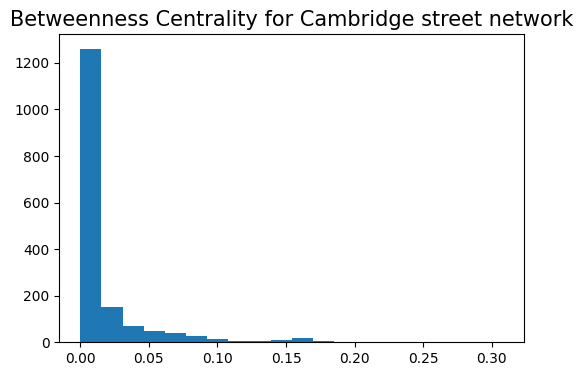

In [45]:
fig, ax = plt.subplots(figsize = (6,4))

plt.hist(b_centrality.values(), bins = 20)
ax.set_title("Betweenness Centrality for Cambridge street network", size=15)

plt.show()

The histogram for betweeness centrality shows that there are a large number of nodes that are not in the centre of shortest path networks, and that there are few nodes which are highly connected to other nodes and play a part in connecting the nodes which are less connected. 

I expect this means that there will be high numbers of traffic that passes through these areas as there are only a few nodes which are part of the shortest paths. The next code will represent this graphically, and also add the betweeness centrality value to the nodes gdf. 

In [46]:
nx.set_node_attributes(G2, nx.betweenness_centrality(G2, weight="length"), name="bc")
nodes = ox.graph_to_gdfs(G2, edges=False)
nodes.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 0.75})

The map above shows that there is one road that runs from north to south that is highly connected. 

In [47]:
nodes.head()

,osmid_original,y,x,highway,street_count,lon,lat,bc,ref,geometry
osmid,,,,,,,,,,
0,104521,5.787578e+06,303443.493261,traffic_signals,3,0.123491,52.203550,0.046914,NaN,POINT (303443.493 5787578.248)
1,"[20823587, 14959440]",5.787423e+06,303524.191412,NaN,0,NaN,NaN,0.079142,NaN,POINT (303524.191 5787422.761)
2,104522,5.787634e+06,303415.054014,NaN,3,0.123043,52.204039,0.040946,NaN,POINT (303415.054 5787633.858)
3,6572136,5.788006e+06,303367.028175,NaN,3,0.122125,52.207366,0.000469,NaN,POINT (303367.028 5788006.284)
4,"[104527, 1196867225]",5.788135e+06,303123.595250,NaN,0,NaN,NaN,0.076962,NaN,POINT (303123.595 5788134.863)


In [48]:
bc_nodes = nodes[['bc']]
bc_nodes.describe()

,bc
count,1665.000000
mean,0.018906
std,0.033985
min,0.000000
25%,0.000562
50%,0.003592
75%,0.021261
max,0.255837


I want to make them into categories so that I can make a descriptive analysis of the number of crashes per betweeness centrality category. I also hope to make a scatter plot that will show the relationship betwen betweenness centrality and number of crashes to show whether there is a relationship. 

array([[<Axes: title={'center': 'bc'}>]], dtype=object)

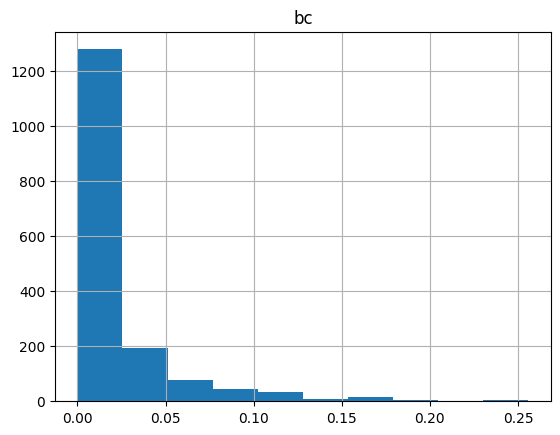

In [49]:
bc_nodes.hist()

Going to categorise the betweeness centrality values into discrete categories: v connected, connected, med, low 
* vhigh = >0.2
* high = 0.1-0.2
* med = 0.05-0.01
* low = 0.01- 0.05
* none = <0.01

The following code is a function that applies an if, elif and else statement. It goes over each row and makes a categorical variable for the betweeness centrality.

In [50]:
#function that applies an if statement to make a new category in the dataframe showing a categorical value of  betweeness centrality

def betweeness_cent(row):
   if row['bc'] == 0:
      return 'Not connected'
   elif 0 < row['bc'] <= 0.05:
      return 'Low Connectivity'
   elif 0.05 < row['bc'] <= 0.1:
       return 'Med Connectivity'
   elif 0.1 < row['bc'] <= 0.2:
       return 'High Connectivity'
   else:
      return 'Extreme Connectivity'

In [51]:
#applying the function to my dataframe
nodes.apply(betweeness_cent, axis=1)

osmid
0       Low Connectivity
1       Med Connectivity
2       Low Connectivity
3       Low Connectivity
4       Med Connectivity
              ...       
1660       Not connected
1661    Low Connectivity
1662       Not connected
1663       Not connected
1664    Low Connectivity
Length: 1665, dtype: object

In [52]:
#adding the applied function 
nodes['bc_category'] = nodes.apply(betweeness_cent, axis=1)
nodes.head() 

,osmid_original,y,x,highway,street_count,lon,lat,bc,ref,geometry,bc_category
osmid,,,,,,,,,,,
0,104521,5.787578e+06,303443.493261,traffic_signals,3,0.123491,52.203550,0.046914,NaN,POINT (303443.493 5787578.248),Low Connectivity
1,"[20823587, 14959440]",5.787423e+06,303524.191412,NaN,0,NaN,NaN,0.079142,NaN,POINT (303524.191 5787422.761),Med Connectivity
2,104522,5.787634e+06,303415.054014,NaN,3,0.123043,52.204039,0.040946,NaN,POINT (303415.054 5787633.858),Low Connectivity
3,6572136,5.788006e+06,303367.028175,NaN,3,0.122125,52.207366,0.000469,NaN,POINT (303367.028 5788006.284),Low Connectivity
4,"[104527, 1196867225]",5.788135e+06,303123.595250,NaN,0,NaN,NaN,0.076962,NaN,POINT (303123.595 5788134.863),Med Connectivity


In [53]:
nodes.explore('bc_category')

Now I am going ot make a small buffer around each node, lets say, 25 metres and see how many crashes are in the buffer. 

First I am going to reproject it to EPSG:27700 so that analyses can be made 

In [54]:
nodes = nodes.to_crs('EPSG:27700')
nodes.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

Making a copy so that if something goes wrong the original dataframe and its geometry will stay the same

In [55]:
nodes_copy = nodes.copy()
nodes_copy.head()

,osmid_original,y,x,highway,street_count,lon,lat,bc,ref,geometry,bc_category
osmid,,,,,,,,,,,
0,104521,5.787578e+06,303443.493261,traffic_signals,3,0.123491,52.203550,0.046914,NaN,POINT (545207.757 258270.162),Low Connectivity
1,"[20823587, 14959440]",5.787423e+06,303524.191412,NaN,0,NaN,NaN,0.079142,NaN,POINT (545298.964 258120.638),Med Connectivity
2,104522,5.787634e+06,303415.054014,NaN,3,0.123043,52.204039,0.040946,NaN,POINT (545175.558 258323.668),Low Connectivity
3,6572136,5.788006e+06,303367.028175,NaN,3,0.122125,52.207366,0.000469,NaN,POINT (545101.987 258691.819),Low Connectivity
4,"[104527, 1196867225]",5.788135e+06,303123.595250,NaN,0,NaN,NaN,0.076962,NaN,POINT (544850.316 258803.295),Med Connectivity


In [56]:
nodes_copy['geometry'] = nodes_copy.geometry.buffer(25)
nodes_copy.head()

,osmid_original,y,x,highway,street_count,lon,lat,bc,ref,geometry,bc_category
osmid,,,,,,,,,,,
0,104521,5.787578e+06,303443.493261,traffic_signals,3,0.123491,52.203550,0.046914,NaN,"POLYGON ((545232.757 258270.162, 545232.636 25...",Low Connectivity
1,"[20823587, 14959440]",5.787423e+06,303524.191412,NaN,0,NaN,NaN,0.079142,NaN,"POLYGON ((545323.964 258120.638, 545323.844 25...",Med Connectivity
2,104522,5.787634e+06,303415.054014,NaN,3,0.123043,52.204039,0.040946,NaN,"POLYGON ((545200.558 258323.668, 545200.437 25...",Low Connectivity
3,6572136,5.788006e+06,303367.028175,NaN,3,0.122125,52.207366,0.000469,NaN,"POLYGON ((545126.987 258691.819, 545126.867 25...",Low Connectivity
4,"[104527, 1196867225]",5.788135e+06,303123.595250,NaN,0,NaN,NaN,0.076962,NaN,"POLYGON ((544875.316 258803.295, 544875.196 25...",Med Connectivity


In [57]:
nodes_copy.explore()

 I am now going to do a point in polygon analysis of the crashes.

In [58]:
crashes_w_buffer =  city_crash.sjoin(nodes_copy, how="inner", predicate='intersects')
crashes_w_buffer.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,...,osmid_original,y,x,highway,street_count,lon,lat,bc,ref,bc_category
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,...,"[6550164, 20826719]",5.787094e+06,304435.524668,NaN,0,NaN,NaN,0.062817,NaN,Med Connectivity
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,...,"[6550164, 20826719]",5.787094e+06,304435.524668,NaN,0,NaN,NaN,0.062817,NaN,Med Connectivity
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,...,104521,5.787578e+06,303443.493261,traffic_signals,3,0.123491,52.20355,0.046914,NaN,Low Connectivity
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,...,"[11221522190, 1860093791]",5.788945e+06,302969.575368,NaN,0,NaN,NaN,0.040145,NaN,Low Connectivity
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,...,6550187,5.790432e+06,304831.317832,NaN,3,0.142128,52.22967,0.014994,NaN,Low Connectivity


In [59]:
crashes_per_category = crashes_w_buffer.groupby('bc_category').size().reset_index(name='total_crashes_per_bc')

# Print or display the result
crashes_per_category.head()

,bc_category,total_crashes_per_bc
0,Extreme Connectivity,10
1,High Connectivity,85
2,Low Connectivity,157
3,Med Connectivity,119
4,Not connected,9


In [60]:
bc_counts = nodes[['bc_category']].value_counts().reset_index(name="Count of centrality nodes")
bc_counts

,bc_category,Count of centrality nodes
0,Low Connectivity,1123
1,Not connected,346
2,Med Connectivity,126
3,High Connectivity,64
4,Extreme Connectivity,6


In [61]:
#binding these two dataframes
Connectivity_Crash_df= pd.merge(crashes_per_category, bc_counts, on="bc_category")
Connectivity_Crash_df

,bc_category,total_crashes_per_bc,Count of centrality nodes
0,Extreme Connectivity,10,6
1,High Connectivity,85,64
2,Low Connectivity,157,1123
3,Med Connectivity,119,126
4,Not connected,9,346


In [62]:
#dividing total crashes by count of nodes to get average crash rate per connectivity node
Connectivity_Crash_df["Average_no_crash_per_node"] = Connectivity_Crash_df["total_crashes_per_bc"]/Connectivity_Crash_df["Count of centrality nodes"]
Connectivity_Crash_df

,bc_category,total_crashes_per_bc,Count of centrality nodes,Average_no_crash_per_node
0,Extreme Connectivity,10,6,1.666667
1,High Connectivity,85,64,1.328125
2,Low Connectivity,157,1123,0.139804
3,Med Connectivity,119,126,0.944444
4,Not connected,9,346,0.026012


I want to make a bar chart showing bc_category and the number of crashes per node, but first going to sort by the dataframe by average crash. 

In [63]:
Connectivity_Crash_df = Connectivity_Crash_df.sort_values(by='Average_no_crash_per_node',ascending=False)
Connectivity_Crash_df

,bc_category,total_crashes_per_bc,Count of centrality nodes,Average_no_crash_per_node
0,Extreme Connectivity,10,6,1.666667
1,High Connectivity,85,64,1.328125
3,Med Connectivity,119,126,0.944444
2,Low Connectivity,157,1123,0.139804
4,Not connected,9,346,0.026012


Text(0.5, 1.0, 'Average Crashes per Betweenness Centrality Category')

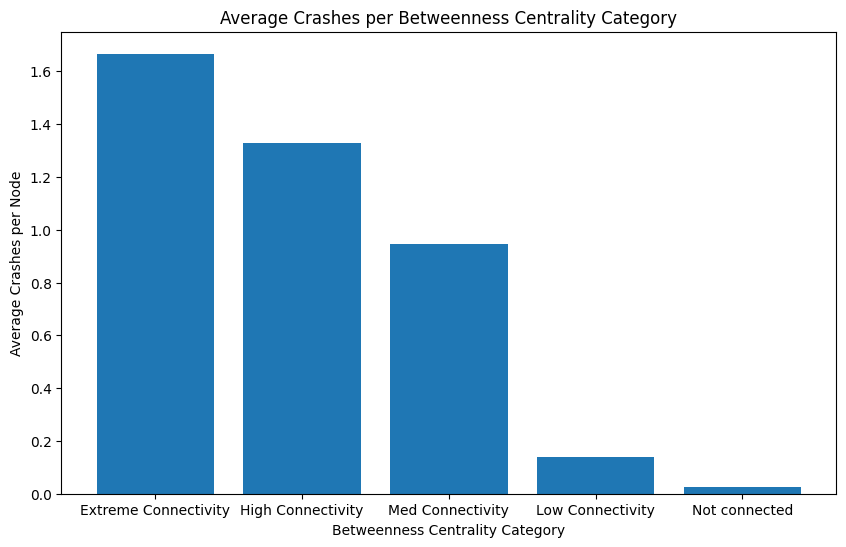

In [64]:
plt.figure(figsize=(10, 6))
plt.bar(Connectivity_Crash_df["bc_category"], Connectivity_Crash_df["Average_no_crash_per_node"])
plt.xlabel('Betweenness Centrality Category')
plt.ylabel('Average Crashes per Node')
plt.title('Average Crashes per Betweenness Centrality Category')

In [65]:
crashes_w_buffer.explore('bc_category', tiles="cartodbdarkmatter")

The bar chart shows that there is a clear relationship between a high betweeness centrality and the number of crashes that occur. This suggsts that there is an issue with the general connectivity of the Cambridge drive network. This suggests that there need to be other routes that can bypass the areas where there is high betweeness centrality. This will offer vehicles an alternative route. The decreased congestion and concentration of hihg betweeness centrality nodes will hopefully reduce the number of crashes that take place throughout Cambridge. This is because, on average there are less crashes within nodes that have a lower connectivity. 

## Bike lanes and accidents 

So I have the area of cycle lanes only, and whilst there are some which are not on roads, so there will be no collisions with cars, there are some which are next to roads, so it will be interesting to see whether there are still crashes with cars in these areas ad maybe determine the severity of these crashes. 

In [66]:
cycle_path.explore()

In [67]:
city_crash.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008,POINT (546231.000 257858.000)
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (546238.000 257859.000)
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (545200.000 258267.000)
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,6. Friday,E07000008,POINT (544638.000 259600.000)
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (546395.000 261212.000)


In [68]:
bike_crash = city_crash[city_crash['Cycles'] > 0]

In [69]:
bike_crash.shape

(383, 15)

In [70]:
bike_crash.explore()

Going to change the crs of cycle_path gdf to 27700 so that the buffer will work 

In [71]:
cycle_path = cycle_path.to_crs('EPSG:27700')
cycle_path.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

Making a copy before making buffer and changing geometries

In [72]:
cycle_path_copy = cycle_path.copy()

In [73]:
cycle_path_copy['geometry'] = cycle_path_copy.geometry.buffer(15)
cycle_path_copy.head()

,,,osmid,oneway,name,highway,maxspeed,reversed,length,geometry,access,width,lanes,ref,est_width,bridge,junction,tunnel,service,area
u,v,key,,,,,,,,,,,,,,,,,,
104558,1481148448,0,134758864,False,NaN,cycleway,NaN,True,9.259,"POLYGON ((544298.925 259005.884, 544298.060 25...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104567,944245369,0,42691276,False,Burrell's Walk,cycleway,NaN,True,5.333,"POLYGON ((544361.612 258475.356, 544360.140 25...",NaN,NaN,NaN,NaN,2.5,NaN,NaN,NaN,NaN,NaN
104576,1014889406,0,3997857,False,NaN,cycleway,NaN,False,4.135,"POLYGON ((544005.802 258508.477, 544007.237 25...",NaN,NaN,NaN,NaN,2.5,NaN,NaN,NaN,NaN,NaN
104578,104587,0,"[3997912, 1210617018]",False,Coton Path,cycleway,NaN,False,374.376,"POLYGON ((543511.555 258571.846, 543510.207 25...",NaN,NaN,NaN,NaN,2.5,NaN,NaN,NaN,NaN,NaN
104587,20962991,0,"[164021976, 3997915, 164021974]",False,Clerk Maxwell Road,cycleway,NaN,False,13.697,"POLYGON ((543171.662 258709.297, 543171.808 25...",NaN,NaN,NaN,NaN,2.5,yes,NaN,NaN,NaN,NaN


**need to explain code below**

In [74]:
cycle_single = cycle_path_copy.unary_union  #merges bike lanes to a single object
bike_crash['Inside_Cycle_Lane'] = bike_crash.intersects(cycle_single) # Select the  points data that intersect with bike lanes
bike_crash.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry,Inside_Cycle_Lane
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (546238.000 257859.000),True
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (546395.000 261212.000),False
18,20180106,18258382,546422,257021,3. Slight,1,0,1,6. Single carriageway,30,0. Not within 20m of junction,1. Fine without high winds,7. Saturday,E07000008,POINT (546422.000 257021.000),False
19,20180107,18256894,547601,258012,2. Serious,1,0,1,1. Roundabout,30,1. Roundabout,1. Fine without high winds,1. Sunday,E07000008,POINT (547601.000 258012.000),False
35,20180109,18257452,546461,257215,3. Slight,1,0,1,1. Roundabout,30,2. Mini roundabout,1. Fine without high winds,3. Tuesday,E07000008,POINT (546461.000 257215.000),False


In [75]:
bike_crash.explore('Inside_Cycle_Lane', cmap='Dark2', tiles="cartodbpositron")

In [76]:
cyclelane_counts = bike_crash['Inside_Cycle_Lane'].value_counts()
cyclelane_counts

Inside_Cycle_Lane
False    243
True     140
Name: count, dtype: int64

In [77]:
cyclelane_percentage = bike_crash['Inside_Cycle_Lane'].value_counts(normalize=True)*100
cyclelane_percentage

Inside_Cycle_Lane
False    63.446475
True     36.553525
Name: proportion, dtype: float64

This code is very interesting, whilst there are a reduced number of crashes of cars and bikes when in cycle lanes. There are still quite a large number of collisions that still take place with bikes in cycle lanes. The next step will be to find out if there are differences in the severity of collisions in bike lanes vs not in bike lanes. 

## Descriptive stats for bike accidents 

I want to know if the bike lanes are able to reduce the severity of crashes with bikes. To do this I am first going to make a cross tabulation of severity and inside cycle lane variables. 

In [78]:
severity_counts = bike_crash['Severity'].value_counts()
severity_counts

Severity
3. Slight     294
2. Serious     87
1. Fatal        2
Name: count, dtype: int64

In [79]:
outcome_counts = bike_crash['Inside_Cycle_Lane'].value_counts()
outcome_counts

Inside_Cycle_Lane
False    243
True     140
Name: count, dtype: int64

In [80]:
cross_tab = pd.crosstab(bike_crash['Severity'], bike_crash['Inside_Cycle_Lane'])
cross_tab

Inside_Cycle_Lane,False,True
Severity,,
1. Fatal,1,1
2. Serious,51,36
3. Slight,191,103


This suggests that there are less crashes in the bike lanes. However it is important to note that there were different total numbers of crashes in each value. Therefore to find out the proportions of severity of crashes I need to divide the false column by 243 and the true column by 140. 

In [81]:
cross_tab_perc = cross_tab.copy()

In [82]:
cross_tab_perc.iloc[:, 1:2]

Inside_Cycle_Lane,True
Severity,
1. Fatal,1
2. Serious,36
3. Slight,103


In [83]:
cross_tab_perc.iloc[:, :1]= (cross_tab.iloc[:, :1] / 243)*100
cross_tab_perc

Inside_Cycle_Lane,False,True
Severity,,
1. Fatal,0.411523,1
2. Serious,20.987654,36
3. Slight,78.600823,103


In [84]:
cross_tab_perc.iloc[:, 1:2] = (cross_tab.iloc[:, 1:2] / 140)*100
cross_tab_perc

Inside_Cycle_Lane,False,True
Severity,,
1. Fatal,0.411523,0.714286
2. Serious,20.987654,25.714286
3. Slight,78.600823,73.571429


In [85]:
cross_tab_perc

Inside_Cycle_Lane,False,True
Severity,,
1. Fatal,0.411523,0.714286
2. Serious,20.987654,25.714286
3. Slight,78.600823,73.571429


To make a bar chart I need to swap the columns and rows around: Transposing them using [.T](https://note.nkmk.me/en/python-pandas-t-transpose/)

In [86]:
severity_bar = cross_tab_perc.T


Text(0.5, 1.0, 'Severity of Crashes depending on location of crash')

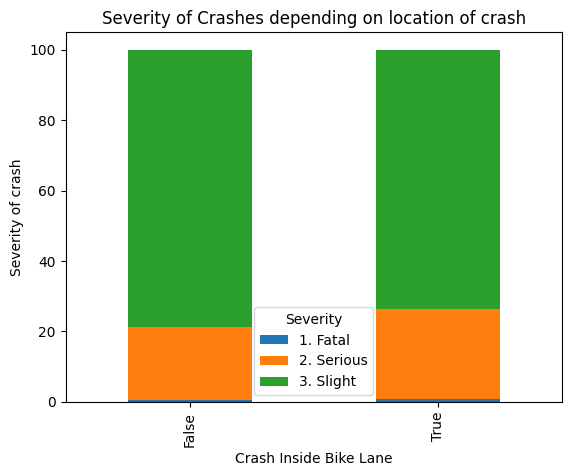

In [87]:
severity_bar.plot(kind='bar', stacked=True)
 
# labels for x & y axis
plt.xlabel('Crash Inside Bike Lane')
plt.ylabel('Severity of crash')
 
# title of plot
plt.title('Severity of Crashes depending on location of crash')

No clear difference in the safety of bike lanes. 

## Other Descriptive statistics

In [88]:
city_crash.head()

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,Junct_det,Weather,Day,Local_Auth,geometry
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,4. Wednesday,E07000008,POINT (546231.000 257858.000)
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,6. Crossroads,2. Raining without high winds,5. Thursday,E07000008,POINT (546238.000 257859.000)
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (545200.000 258267.000)
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,6. Crossroads,1. Fine without high winds,6. Friday,E07000008,POINT (544638.000 259600.000)
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,3. T & Stag Jct,1. Fine without high winds,6. Friday,E07000008,POINT (546395.000 261212.000)


**Day of crash and number of crashes**

<Axes: ylabel='Day'>

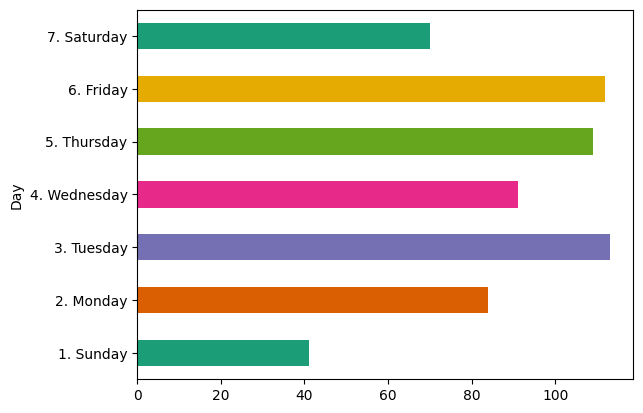

In [89]:
city_crash.groupby('Day').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))

**Speed Lim and Severity Cross tab**

In [100]:
speed_limit_tab = pd.crosstab(city_crash['Speed_Lim'], city_crash['Severity'])
speed_limit_tab

Severity,1. Fatal,2. Serious,3. Slight
Speed_Lim,,,
20,0,29,75
30,2,95,388
40,0,2,12
50,0,1,2
60,0,2,2
70,0,3,7


**betweeness centrality and severity**

In [91]:
crashes_w_buffer

,Date,Police_ref,Easting,Northing,Severity,Casualties,Pedestrian,Cycles,Road_Type,Speed_Lim,...,osmid_original,y,x,highway,street_count,lon,lat,bc,ref,bc_category
3,20180103,18257077,546231,257858,3. Slight,1,0,0,6. Single carriageway,20,...,"[6550164, 20826719]",5.787094e+06,304435.524668,NaN,0,NaN,NaN,0.062817,NaN,Med Connectivity
9,20180104,18256231,546238,257859,3. Slight,1,0,1,6. Single carriageway,30,...,"[6550164, 20826719]",5.787094e+06,304435.524668,NaN,0,NaN,NaN,0.062817,NaN,Med Connectivity
11,20180105,18257015,545200,258267,3. Slight,1,1,0,6. Single carriageway,30,...,104521,5.787578e+06,303443.493261,traffic_signals,3,0.123491,52.203550,0.046914,NaN,Low Connectivity
12,20180105,18259273,544638,259600,3. Slight,1,0,0,6. Single carriageway,20,...,"[11221522190, 1860093791]",5.788945e+06,302969.575368,NaN,0,NaN,NaN,0.040145,NaN,Low Connectivity
13,20180105,18259870,546395,261212,3. Slight,1,0,1,6. Single carriageway,30,...,6550187,5.790432e+06,304831.317832,NaN,3,0.142128,52.229670,0.014994,NaN,Low Connectivity
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,20171212,17250559,544571,254791,1. Fatal,1,0,1,6. Single carriageway,30,...,"[21642149, 21642221]",5.784151e+06,302551.254005,NaN,0,NaN,NaN,0.082192,NaN,Med Connectivity
1373,20171214,17251662,545130,257653,3. Slight,1,0,1,1. Roundabout,30,...,609070,5.786967e+06,303321.099330,mini_roundabout,3,0.122057,52.198021,0.081361,NaN,Med Connectivity
1390,20171217,17268284,547449,259381,3. Slight,1,0,0,6. Single carriageway,30,...,19850741,5.788531e+06,305757.882053,NaN,3,0.156769,52.212924,0.078255,NaN,Med Connectivity
1394,20171219,17255254,545561,260230,3. Slight,1,0,0,6. Single carriageway,30,...,21591250,5.789493e+06,303941.985900,NaN,3,0.129667,52.220924,0.000000,NaN,Not connected


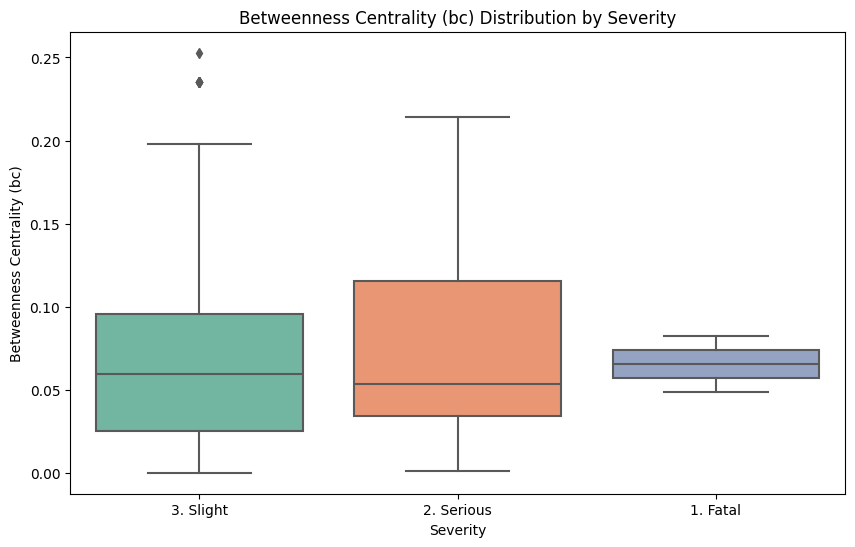

In [93]:
# Violin plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Severity', y='bc', data=crashes_w_buffer, palette='Set2')
plt.title('Betweenness Centrality (bc) Distribution by Severity')
plt.xlabel('Severity')
plt.ylabel('Betweenness Centrality (bc)')
plt.show()


**Seasonal Affect on Crashes**

I want to find out if there are differences in the number/type of crashes that take place between seasons. So I am going to first make a month and column and see if there are more crashes in certain months and then maybe recategorise the months into season variables and determine if there are differences in the types of crashes. I am going to change the date dtype so that I can do this. However due to trial and error it will not let me create a map when the date is in this from so I am going to make a copy of city_crash before making any changes 

date_crash = city_crash.copy()
date_crash.head()

date_crash['Date'] = pd.to_datetime(date_crash['Date'], format='%Y%m%d')
date_crash.head()

date_crash['month'] = date_crash['Date'].dt.month
date_crash.head()

date_crash.groupby('month').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))

month = date_crash.groupby('month')['Severity'].size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))

date_crash.groupby('month')['Severity'].size().plot(kind='barh', color=colors)


## Determining if deprivation or access to car has an effect 

In [115]:
cambs_IMD.explore('IMD_rank')